#### MNIT dataset 
- has data of written digits.
- Stores the data in form of pixels, each digit is represented in form of 28pixel * 28pixel = 784 pixels.
- Each pixel is represented in one column, hence there are 784 columns.
- We have 42000 rows, i.e. 42000 numbers and each number is represented with 784 columns
- Use a model and predict the numbers.
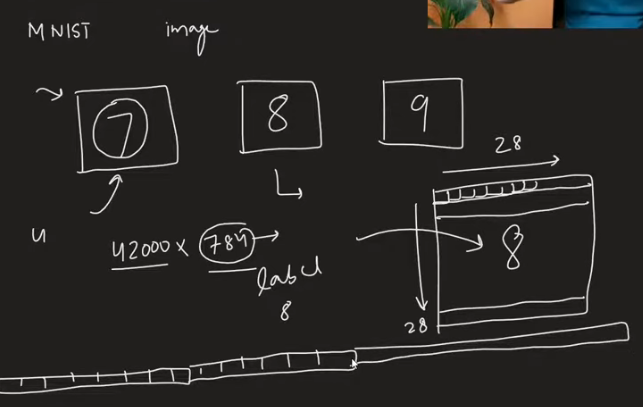

In [7]:
import pandas as pd # For data processing.

MNIT_DF = pd.read_csv(r'C:\Users\ACER\Desktop\Kranthi\DataScience_Desktop\MachineLearningFiles\MNIT.csv')

In [18]:
MNIT_DF.shape
# (42000,785) 1 extra column is a label, which has the actual value, if label = 8, that 8 is represented in 784 columns (Pixels)

MNIT_DF.iloc[18306,:]
# Row 18306 has label 8 , which means all the pixes represent value 8.

label       8
pixel0      0
pixel1      0
pixel2      0
pixel3      0
           ..
pixel779    0
pixel780    0
pixel781    0
pixel782    0
pixel783    0
Name: 18306, Length: 785, dtype: int64

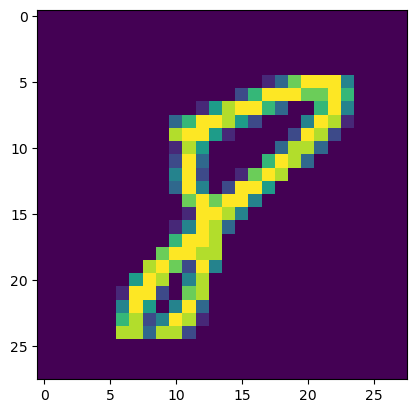

In [24]:
# In above data, we can see row number 18306 has label 8 which means data is 8
# Visualize this data.

import matplotlib.pyplot as plt

plt.imshow(MNIT_DF.iloc[18306,1:].values.reshape(28,28))

In [22]:
import numpy as np # For Linear Algebra.

### Use any machine learning model without PCA to predict the values.
- i.e. use all the columns in the model building which is a time consuming task as we are dealing with all the 784 features.

In [34]:
# Prepare the data 

x = MNIT_DF.iloc[:,1:]
y = MNIT_DF.iloc[:,0]

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = 0.2,random_state=42)
x_train.shape

(33600, 784)

In [36]:
# Since the dataset is perfect, directly start with model building. no need of any scaling, encoding, imputing etc.
# Create a model and train the model.

from sklearn.neighbors import KNeighborsClassifier

KNeighborsClassifier_Obj = KNeighborsClassifier()
KNeighborsClassifier_Obj.fit(x_train,y_train)
# KNN will keep the similar images nearby for prediction.
# Calculates the distance of 1 data point with the other 33599 * 784 datapoints.

KNeighborsClassifier()

In [40]:
import time
start = time.time()
y_predict = KNeighborsClassifier_Obj.predict(x_test)
end = time.time()-start
print("Time taken in seconds ", end)

Time taken in seconds  7.2216784954071045


In [41]:
from sklearn.metrics import accuracy_score

accuracy_score(y_test,y_predict)

0.9648809523809524

### Use PCA to bring down the number of features.

In [70]:
# Step1:- Scale the input features - Using Standard Scaler - Mean centric

from sklearn.preprocessing import StandardScaler

StandardScaler_Obj = StandardScaler()

x_train_scaled = StandardScaler_Obj.fit_transform(x_train)
x_test_scaled = StandardScaler_Obj.transform(x_test)

In [71]:
# Steps:- In case of manual >>> 
# Get the CoVariance Matrix on the scaled data for all the columns. 
# Get the Eigen Vectors for the CoVariance Matrix.
# Pick the top2 Eigen Vectors, which will become our PC1 and PC2 - this is as per our wish
# Transpose the eigen vectors as the size of dataset and eigen vectors is different and transform the data.

# Step2:- Since we are using sklearn PCA, it automatically creates covariance matrix and identifies the number of Eigen vectors as per the 
# parameter values, once the number of PCA is decided, it transforms the all input features into those many number of PCs.

from sklearn.decomposition import PCA

PCA_Obj_All = PCA(n_components=None) 
# When None or no parameter is given, default is it creates the same number of principal components as input features.
# In this case it creates 784 PCs
# Then transforms all the 784 input features into 784 PCs.

In [62]:
x_train_PCA_All = PCA_Obj_All.fit_transform(x_train_scaled)
x_test_PCA_All = PCA_Obj_All.transform(x_test_scaled)
x_train_PCA_All.shape

(33600, 784)

In [136]:
# Since the purpose of PCA is to reduce the number of features, no point in keeping all the 784 features into PCs.
# Let us rerun PCA with only 100 PCs.

from sklearn.decomposition import PCA

PCA_Obj = PCA(n_components=100) 
# Now we are only taking the top 100 Eigen vectors
# In background, Since we are using sklearn PCA, it automatically creates covariance matrix and derives 100 Eigen vectors as per the 
# parameter value n_components, once the 100 eigen vectors are identified, it transforms all 784 input features into 100 PCs.
# i.e. dot product of input data (33600,784) with 100 eigen vectors (100,784) > Transpose (784,100) >>> Final size after transform (33600,100)

In [137]:
x_train_PCA_100 = PCA_Obj.fit_transform(x_train_scaled)
x_test_PCA_100 = PCA_Obj.transform(x_test_scaled)
x_train_PCA_100.shape
PCA_Obj.get_feature_names_out()

array(['pca0', 'pca1', 'pca2', 'pca3', 'pca4', 'pca5', 'pca6', 'pca7',
       'pca8', 'pca9', 'pca10', 'pca11', 'pca12', 'pca13', 'pca14',
       'pca15', 'pca16', 'pca17', 'pca18', 'pca19', 'pca20', 'pca21',
       'pca22', 'pca23', 'pca24', 'pca25', 'pca26', 'pca27', 'pca28',
       'pca29', 'pca30', 'pca31', 'pca32', 'pca33', 'pca34', 'pca35',
       'pca36', 'pca37', 'pca38', 'pca39', 'pca40', 'pca41', 'pca42',
       'pca43', 'pca44', 'pca45', 'pca46', 'pca47', 'pca48', 'pca49',
       'pca50', 'pca51', 'pca52', 'pca53', 'pca54', 'pca55', 'pca56',
       'pca57', 'pca58', 'pca59', 'pca60', 'pca61', 'pca62', 'pca63',
       'pca64', 'pca65', 'pca66', 'pca67', 'pca68', 'pca69', 'pca70',
       'pca71', 'pca72', 'pca73', 'pca74', 'pca75', 'pca76', 'pca77',
       'pca78', 'pca79', 'pca80', 'pca81', 'pca82', 'pca83', 'pca84',
       'pca85', 'pca86', 'pca87', 'pca88', 'pca89', 'pca90', 'pca91',
       'pca92', 'pca93', 'pca94', 'pca95', 'pca96', 'pca97', 'pca98',
       'pca99'], dtyp

### Use any machine learning model after PCA to predict the values.
- i.e. use only 100 columns as per PCA in the model building instead of all the 784 features.

In [75]:
from sklearn.neighbors import KNeighborsClassifier

KNeighborsClassifier_Obj_PCA = KNeighborsClassifier()
KNeighborsClassifier_Obj_PCA.fit(x_train_PCA_100,y_train)
# KNN will keep the similar images nearby for prediction.
# Calculates the distance of 1 data point with the other 33599 * 100 columns, instead of 33599 * 784 columns.

KNeighborsClassifier()

In [77]:
import time
start = time.time()
y_predict_PCA_100 = KNeighborsClassifier_Obj_PCA.predict(x_test_PCA_100)
end = time.time()-start
print("Time taken in seconds ", end)

Time taken in seconds  0.7121589183807373


In [78]:
from sklearn.metrics import accuracy_score

accuracy_score(y_test,y_predict_PCA_100)

0.9544047619047619

In [83]:
# Even though we are just using 100 features out of 784
# We can notice the model predict time is reduced to 0.7 seconds whereas earlier it was 7 seconds.
# Accuracy score earlier was 0.96 and now it is 0.95

In [86]:
for i in range(1,100):
    print("Taking PCs ",i)
    PCA_Obji = PCA(n_components=i)
    x_train_PCA_i = PCA_Obji.fit_transform(x_train_scaled)
    x_test_PCA_i = PCA_Obji.transform(x_test_scaled)

    KNeighborsClassifier_Obj_PCAi = KNeighborsClassifier()
    KNeighborsClassifier_Obj_PCAi.fit(x_train_PCA_i,y_train)
    start = time.time()
    y_predict_PCA_i = KNeighborsClassifier_Obj_PCAi.predict(x_test_PCA_i)
    end = time.time()-start
    print("Time taken in seconds ", end)

    print("Accuracy Score ",accuracy_score(y_test,y_predict_PCA_i))
    print("-------------------------------------------------")

# We can see below just with 31 PCs we are getting accuracy score of 95.
# Instead of taking 100 PCs, we can just take 31 PCs.
# We reduces the features from 784 to 31 and prediction time is reduced from 7 seconds to 0.6 seconds.

Taking PCs  1
Time taken in seconds  0.4764084815979004
Accuracy Score  0.2580952380952381
-------------------------------------------------
Taking PCs  2
Time taken in seconds  0.4896271228790283
Accuracy Score  0.3236904761904762
-------------------------------------------------
Taking PCs  3
Time taken in seconds  0.5043637752532959
Accuracy Score  0.5104761904761905
-------------------------------------------------
Taking PCs  4
Time taken in seconds  0.5321335792541504
Accuracy Score  0.6663095238095238
-------------------------------------------------
Taking PCs  5
Time taken in seconds  0.6155233383178711
Accuracy Score  0.7378571428571429
-------------------------------------------------
Taking PCs  6
Time taken in seconds  0.6434822082519531
Accuracy Score  0.8227380952380953
-------------------------------------------------
Taking PCs  7
Time taken in seconds  0.7593915462493896
Accuracy Score  0.8436904761904762
-------------------------------------------------
Taking PCs  8

### Visualize the PCs - in 2D

In [88]:
PCA_Obj_2 = PCA(n_components=2)

x_train_PCA_2 = PCA_Obj_2.fit_transform(x_train_scaled)
x_test_PCA_2 = PCA_Obj_2.transform(x_test_scaled)
x_train_PCA_2.shape

(33600, 2)

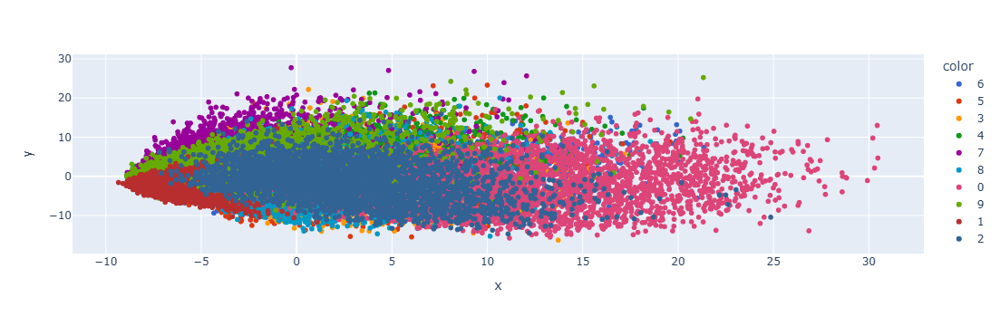

In [89]:
# Plot the 2D, earlier this was 784 columns

import plotly.express as px

y_train_PCA = y_train.astype(str)

fig = px.scatter(x=x_train_PCA_2[:,0],
                 y=x_train_PCA_2[:,1],
                 color=y_train_PCA,
                 color_discrete_sequence=px.colors.qualitative.G10
                )
fig.show()

### Visualize the PCs - in 3D

In [90]:
PCA_Obj_3 = PCA(n_components=3)

x_train_PCA_3 = PCA_Obj_3.fit_transform(x_train_scaled)
x_test_PCA_3 = PCA_Obj_3.transform(x_test_scaled)
x_train_PCA_3.shape

(33600, 3)

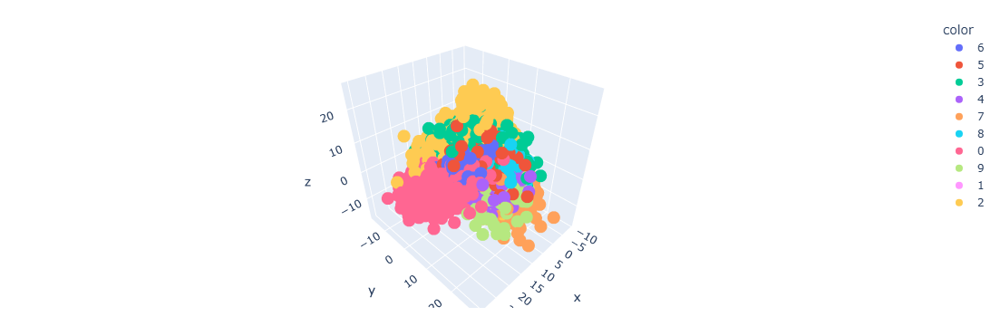

In [92]:
# Plot the 2D, earlier this was 784 columns

import plotly.express as px

y_train_PCA = y_train.astype(str)

fig = px.scatter_3d(x=x_train_PCA_3[:,0],
                 y=x_train_PCA_3[:,1],
                 z=x_train_PCA_3[:,2],
                 color=y_train_PCA)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20)
)
fig.show()

## Attributes of PCA
- Helpful to find the PCs that are having maximum impact / spread / variance on the outcome.

In [93]:
PCA_Obj_3 = PCA(n_components=3)

x_train_PCA_3 = PCA_Obj_3.fit_transform(x_train_scaled)
x_test_PCA_3 = PCA_Obj_3.transform(x_test_scaled)
x_train_PCA_3.shape

(33600, 3)

In [134]:
PCA_Obj_3.get_feature_names_out()

array(['pca0', 'pca1', 'pca2'], dtype=object)

In [96]:
PCA_Obj_3.explained_variance_
# Since we are taking requesting only top 3 PCs, the below shows top 3 Eigen values, not the percentages.

array([40.67111198, 29.17023401, 26.74459621])

In [99]:
PCA_Obj_3.components_

# Since we are requesting only top 3 PCs, the below shows top 3 Eigen vectors.
# For 3D, we will have 3 Eigen vectors.

array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [-0., -0., -0., ..., -0., -0., -0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.]])

In [101]:
PCA_Obj_3.components_.shape
# 3 Eigen vectors with 784 columns.
# We use this with the input data to transform the data.
# Ex: (33600, 784) . T(3, 784) >>> (33600, 784) . (784, 3) >>> (33600, 3) >>> Converts to 3 PCs from 784.

(3, 784)

## How to identify Optimum number of PCs instead of using loop to find the top PCs.
- Take 90% representation of the variance

In [126]:
PCA_Obj_784 = PCA(n_components=784)

x_train_PCA_784 = PCA_Obj_784.fit_transform(x_train_scaled)
x_test_PCA_784 = PCA_Obj_784.transform(x_test_scaled)
x_train_PCA_784.shape

PCA_Obj_784.explained_variance_
# lambda(λ) = Eigen Value, represents how much the PC represents input features explained variance.

array([4.06711120e+01, 2.91702340e+01, 2.67445962e+01, 2.08534479e+01,
       1.81489188e+01, 1.58529825e+01, 1.38710810e+01, 1.24805897e+01,
       1.10279424e+01, 1.00958253e+01, 9.63317821e+00, 8.62785945e+00,
       8.06303131e+00, 7.89511749e+00, 7.44167929e+00, 7.17032873e+00,
       6.73266373e+00, 6.62744023e+00, 6.41499161e+00, 6.25808269e+00,
       5.90495742e+00, 5.76521585e+00, 5.52084601e+00, 5.32003847e+00,
       5.18309925e+00, 4.93439597e+00, 4.90652171e+00, 4.71800493e+00,
       4.49824444e+00, 4.43140305e+00, 4.32604521e+00, 4.23491831e+00,
       4.10335015e+00, 4.06731180e+00, 4.02362178e+00, 3.84130473e+00,
       3.81886146e+00, 3.71316498e+00, 3.60918108e+00, 3.47303214e+00,
       3.42842989e+00, 3.38841159e+00, 3.29157511e+00, 3.22927379e+00,
       3.21745142e+00, 3.15810372e+00, 3.12620905e+00, 3.10412385e+00,
       3.05892795e+00, 3.03728188e+00, 2.96540461e+00, 2.94033669e+00,
       2.86828564e+00, 2.82617865e+00, 2.80038441e+00, 2.77411221e+00,
      

#### Take the percentage of each lamba value

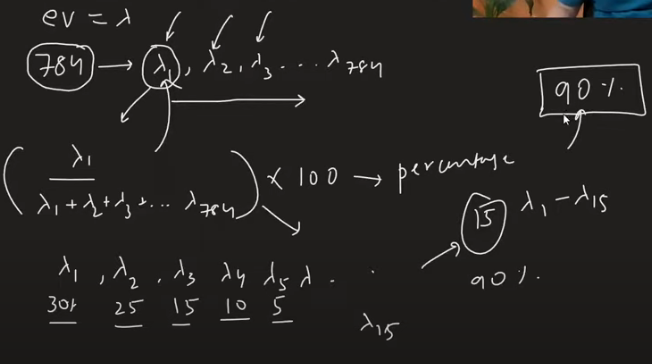
- In the above pic, if we want to represent at least 90% variance of the data, take percentage of each lambda and the min value of the sum should be 90

In [127]:
# We have an attribute which gives the percentage of lambda value.

PCA_Obj_784.explained_variance_ratio_
# This will have the percentage of explained variance that is discussed above, instead of manual calculation.

# lambda(λ) = Eigen Value, represents how much the PC represents input features explained variance.
# Below we can see 
# λ1 or Eigen Value1 represents 5.7% of total input features explained variance.
# λ2 or Eigen Value2 represents 4.1% of total input features explained variance.
# λ3 or Eigen Value3 represents 3.8% of total input features explained variance.
# Combindly top 3 eigen values represent 5.7+4.1+3.8 = 13% of the input data explained variance.

array([5.78519225e-02, 4.14926968e-02, 3.80423901e-02, 2.96626277e-02,
       2.58156168e-02, 2.25498018e-02, 1.97306802e-02, 1.77527998e-02,
       1.56865066e-02, 1.43606328e-02, 1.37025484e-02, 1.22725500e-02,
       1.14691200e-02, 1.12302739e-02, 1.05852885e-02, 1.01993106e-02,
       9.57676152e-03, 9.42708817e-03, 9.12489429e-03, 8.90170190e-03,
       8.39940495e-03, 8.20063196e-03, 7.85303229e-03, 7.56739707e-03,
       7.37261022e-03, 7.01884653e-03, 6.97919728e-03, 6.71104483e-03,
       6.39845030e-03, 6.30337291e-03, 6.15350848e-03, 6.02388659e-03,
       5.83673972e-03, 5.78547759e-03, 5.72333148e-03, 5.46399774e-03,
       5.43207369e-03, 5.28172755e-03, 5.13381744e-03, 4.94015474e-03,
       4.87671103e-03, 4.81978768e-03, 4.68204430e-03, 4.59342487e-03,
       4.57660834e-03, 4.49219022e-03, 4.44682221e-03, 4.41540749e-03,
       4.35111936e-03, 4.32032928e-03, 4.21808870e-03, 4.18243127e-03,
       4.07994349e-03, 4.02004913e-03, 3.98335855e-03, 3.94598812e-03,
      

In [129]:
# Verify if the sum of all is 100% for all the 784 PCs.

Total_Percentage =0
for i in PCA_Obj_784.explained_variance_ratio_:
    Total_Percentage = Total_Percentage + i
print(Total_Percentage)

0.9999999999999994


In [132]:
# Get cumulative sum, so that we can identify the number of PCs required for 90% of data representation.

Percentage =0
PC_Count = 1
for i in PCA_Obj_784.explained_variance_ratio_:
    Percentage = Percentage + np.cumsum(i)
    print("Percentage for ", PC_Count, " PC is ",Percentage)
    PC_Count = PC_Count + 1
# Around 223 - 90% variance is explained.
# 90% Variance is good enough for best results.

Percentage for  1  PC is  [0.05785192]
Percentage for  2  PC is  [0.09934462]
Percentage for  3  PC is  [0.13738701]
Percentage for  4  PC is  [0.16704964]
Percentage for  5  PC is  [0.19286525]
Percentage for  6  PC is  [0.21541506]
Percentage for  7  PC is  [0.23514574]
Percentage for  8  PC is  [0.25289854]
Percentage for  9  PC is  [0.26858504]
Percentage for  10  PC is  [0.28294568]
Percentage for  11  PC is  [0.29664822]
Percentage for  12  PC is  [0.30892077]
Percentage for  13  PC is  [0.32038989]
Percentage for  14  PC is  [0.33162017]
Percentage for  15  PC is  [0.34220546]
Percentage for  16  PC is  [0.35240477]
Percentage for  17  PC is  [0.36198153]
Percentage for  18  PC is  [0.37140862]
Percentage for  19  PC is  [0.38053351]
Percentage for  20  PC is  [0.38943521]
Percentage for  21  PC is  [0.39783462]
Percentage for  22  PC is  [0.40603525]
Percentage for  23  PC is  [0.41388828]
Percentage for  24  PC is  [0.42145568]
Percentage for  25  PC is  [0.42882829]
Percentag

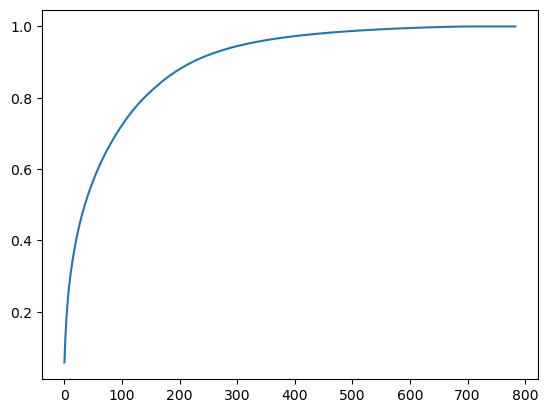

In [133]:
# Or plot a graph to understand the Percentage VS PC Count

plt.plot(np.cumsum(PCA_Obj_784.explained_variance_ratio_))
# Around 223 - 90% variance is explained.
# 90% Variance is good enough for best results.